# Import libraries

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium

from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

import joblib

import time
import os

# Import Data

In [2]:
# Direct path to file - update as needed 
file_df_166_large='/Users/ze/Desktop/Sample Data/v5_20240204_094535_166m.csv'

# Create dataframe from filepath 
df_166_large=pd.read_csv(file_df_166_large)

In [3]:
# current df to work on
df=df_166_large

In [4]:
# Verify 
df

,Timestamp,accelX(g),accelY(g),accelZ(g),accelUserX(g),accelUserY(g),accelUserZ(g),gyroX(rad/s),gyroY(rad/s),gyroZ(rad/s),...,ActivityType,ActivityConfidence,Pressure(kilopascals),RelativeAltitude(meters),magX(µT),magY(µT),magZ(µT),calMagX(µT),calMagY(µT),calMagZ(µT)
0,04-Feb-2024 09:45:35.856,0.1922,-0.3479,-0.9826,0.0070,0.1008,0.0347,-0.2991,0.1544,-0.0899,...,Unknown,High,76.1190,0.0000,453.5881,-134.0068,-256.9979,-9.0679,-27.6036,-45.7127
1,04-Feb-2024 09:45:35.933,0.1124,-0.3443,-0.6441,-0.0636,0.0793,0.2446,0.5334,0.1147,0.0571,...,Unknown,High,76.1190,0.0000,453.9400,-135.6777,-255.1708,-9.1050,-28.5956,-44.6065
2,04-Feb-2024 09:45:36.033,0.0908,-0.3970,-0.6866,-0.0714,0.0364,0.2205,0.2636,-0.0981,0.1425,...,Unknown,High,76.1190,0.0000,454.2118,-134.6189,-255.8427,-8.6285,-27.0907,-45.4847
3,04-Feb-2024 09:45:36.134,0.2089,-0.3202,-0.8407,0.0212,0.0493,0.0303,-0.7097,-0.0324,-0.1591,...,Unknown,High,76.1190,0.0000,455.1006,-131.0334,-258.1115,-7.9854,-24.0043,-47.4228
4,04-Feb-2024 09:45:36.234,0.1273,-0.3288,-0.7545,-0.0642,0.0174,0.1596,-0.1509,-0.2361,-0.0341,...,Unknown,High,76.1190,0.0000,454.7579,-129.3629,-257.8744,-8.1491,-21.6835,-47.6756
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99573,04-Feb-2024 12:31:51.324,0.1062,-0.3922,-0.8978,0.0277,-0.0178,0.0298,0.0982,0.1840,-0.0010,...,Walking,High,86.6749,-1050.2614,476.1750,-93.7697,-259.9379,15.0748,21.6238,-55.3556
99574,04-Feb-2024 12:31:51.424,0.1005,-0.3699,-0.9621,0.0010,0.0090,-0.0396,0.0164,0.1958,0.0745,...,Walking,High,86.6744,-1050.2139,477.7822,-93.4013,-260.4801,16.5264,22.0226,-55.5426
99575,04-Feb-2024 12:31:51.524,0.1338,-0.4070,-0.9338,0.0017,-0.0075,-0.0181,0.0923,0.1252,-0.0051,...,Walking,High,86.6744,-1050.2139,478.6812,-93.5132,-260.7642,17.7100,21.9918,-55.9416
99576,04-Feb-2024 12:31:51.624,0.1456,-0.4298,-0.8418,0.0095,-0.0192,0.0514,0.1790,0.1332,-0.0450,...,Walking,High,86.6744,-1050.2139,479.1516,-93.4073,-261.7523,18.2491,22.0359,-56.5064


# Helper functions

In [5]:
def convert_datetime(df):

    # Convert 'Timestamp' column to datetime format
    df['Timestamp'] = pd.to_datetime(df['Timestamp'], unit='ns')

    return df

In [6]:
def reduce_sampling_rate(df):
    df.set_index('Timestamp', inplace=True)
    # Set the 'Timestamp' column as the DataFrame's index
    df_resampled = df.resample('S').first()
    # Reset the index to create a standard numerical index
    df_resampled.reset_index(inplace=True)
    return df_resampled

In [7]:
def plot_total_alt_over_time(df, plot_title='Total Tracked Altitude Over Time'):

    # Create the scatter plot using Plotly Express
    fig = px.scatter(df,
                     x=df['Timestamp'],
                     y=df['Alt(m)'])

    # Update the layout with title and axis labels
    fig.update_layout(
            title='Altitude over Time',
            xaxis_title='Timestamp',
            yaxis_title='Altitude (m)',
            coloraxis_colorbar=dict(title='Cluster Label'),
            width=1000,
            height=600
        )

    # Show the Plotly figure
    fig.show()

In [8]:
def plot_manual_labeling(df):
    # Plot for Altitude over Time, colored by 'on_lift' status
    plt.figure(figsize=(15, 10))

    # Plot points where 'on_lift' is 1 with one color
    plt.scatter(df.loc[df['on_lift'] == 1, 'Timestamp'],
                df.loc[df['on_lift'] == 1, 'Alt(m)'],
                c='red',
                label='On the lift',
                marker='o')

    # Plot points where 'on_lift' is 0 with another color
    plt.scatter(df.loc[df['on_lift'] == 0, 'Timestamp'],
                df.loc[df['on_lift'] == 0, 'Alt(m)'],
                c='blue',
                label='Not on the lift',
                marker='o')

    plt.title('Labeled Data')
    plt.xlabel('Timestamp')
    plt.ylabel('Altitude (m)')
    plt.legend()
    plt.show()

In [9]:
def map_lift_rides(df):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(),
                  df['Long'].mean()]
    mymap = folium.Map(location=map_center, zoom_start=10)

    # Plot data points with on_lift type
    on_lift = df[df['on_lift'] == 1]
    for index, row in on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                            radius=5,
                            color='red',
                            fill=True,
                            fill_color='red',
                            tooltip=str(row['Timestamp'])).add_to(mymap)

    # Plot data points with not_on_lift types
    not_on_lift = df[df['on_lift'] != 1]
    for index, row in not_on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                            radius=5,
                            color='blue',
                            fill=True,
                            fill_color='blue',
                            tooltip=str(row['Timestamp'])).add_to(mymap)

    # Return the map object
    return mymap


In [10]:
#Map all tracked movement based on lat and long of GPS data

def map_tracked_movement(df, zoom_start=12):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    movement_on_map = folium.Map(location=map_center, zoom_start=zoom_start)

    # Add CircleMarkers for each data point
    for index, row in df.iterrows():
        folium.CircleMarker(location=[
                            row['Lat'], 
                            row['Long']], 
                            radius=5, 
                            color='blue', 
                            fill=True, 
                            fill_color='blue').add_to(movement_on_map)

    # Display the map
    return movement_on_map

In [11]:
#Map only lifts rides

def map_lift_rides(df, column='on_lift', zoom_start=15):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    lift_map = folium.Map(location=map_center, zoom_start=zoom_start)

    # Plot data points with on_lift type
    on_lift = df[df[column] == 1]
    for _, row in on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                                      radius=5,
                                      color='red',
                                      fill=True,
                                      fill_color='red',
                                      tooltip=str(row['Timestamp'])).add_to(lift_map)

    # Return the map object
    return lift_map

# Reduce sample size 

In [12]:
# Use helper function to convert 'Timestamp' column dytpe 
df=convert_datetime(df)
# Verify 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99578 entries, 0 to 99577
Data columns (total 44 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Timestamp                 99578 non-null  datetime64[ns]
 1   accelX(g)                 99578 non-null  float64       
 2   accelY(g)                 99578 non-null  float64       
 3   accelZ(g)                 99578 non-null  float64       
 4   accelUserX(g)             99578 non-null  float64       
 5   accelUserY(g)             99578 non-null  float64       
 6   accelUserZ(g)             99578 non-null  float64       
 7   gyroX(rad/s)              99578 non-null  float64       
 8   gyroY(rad/s)              99578 non-null  float64       
 9   gyroZ(rad/s)              99578 non-null  float64       
 10  Roll(rads)                99578 non-null  float64       
 11  Pitch(rads)               99578 non-null  float64       
 12  Yaw(rads)         

In [13]:
# Use helper function to resample to seconds  
df_resampled=reduce_sampling_rate(df)
# Verify 
print(f'Shape before resampling: {df.shape}')
print(f'Shape after resampling: {df_resampled.shape}\n')
df_resampled.info()

Shape before resampling: (99578, 43)
Shape after resampling: (9977, 44)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9977 entries, 0 to 9976
Data columns (total 44 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Timestamp                 9977 non-null   datetime64[ns]
 1   accelX(g)                 9977 non-null   float64       
 2   accelY(g)                 9977 non-null   float64       
 3   accelZ(g)                 9977 non-null   float64       
 4   accelUserX(g)             9977 non-null   float64       
 5   accelUserY(g)             9977 non-null   float64       
 6   accelUserZ(g)             9977 non-null   float64       
 7   gyroX(rad/s)              9977 non-null   float64       
 8   gyroY(rad/s)              9977 non-null   float64       
 9   gyroZ(rad/s)              9977 non-null   float64       
 10  Roll(rads)                9977 non-null   float64       
 11  Pitch(rad

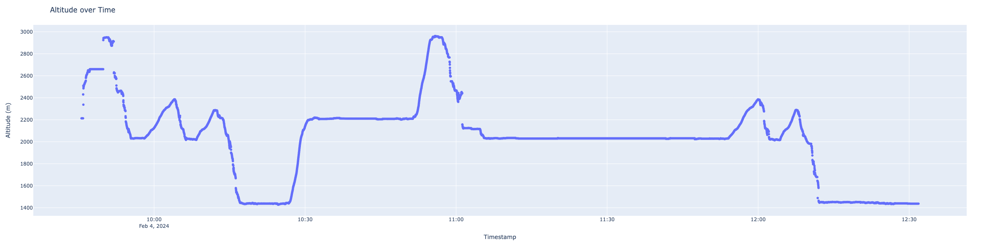

In [14]:
# Verify by plotting
plot_total_alt_over_time(df_resampled)

In [15]:
# If needed: Export resampled data frame to csv
name_of_csv_resampled='df_166_resampled.csv'
df_resampled.to_csv(name_of_csv_resampled, index=False)

# Label data to prepare df for supervised learning

In [16]:
# Assign dataframe that is yet to be labeled
df_to_be_labeled=df_resampled
initial_shape_df_to_be_labeled=df_to_be_labeled.shape
print(f'Initial shape: {initial_shape_df_to_be_labeled}')

Initial shape: (9977, 44)


In [17]:
# Check for missing values and drop rows with missing values
df_to_be_labeled.isnull().sum()

Timestamp                   0
accelX(g)                   0
accelY(g)                   0
accelZ(g)                   0
accelUserX(g)               0
accelUserY(g)               0
accelUserZ(g)               0
gyroX(rad/s)                0
gyroY(rad/s)                0
gyroZ(rad/s)                0
Roll(rads)                  0
Pitch(rads)                 0
Yaw(rads)                   0
m11                         0
m12                         0
m13                         0
m21                         0
m22                         0
m23                         0
m31                         0
m32                         0
m33                         0
qX                          0
qY                          0
qZ                          0
qW                          0
Lat                         0
Long                        0
Speed(m/s)                  0
TrueHeading                 0
Alt(m)                      0
HorizontalAccuracy(m)       0
VerticalAccuracy(m)         0
Course    

In [18]:
# Drop rows with any missing values
df_to_be_labeled.dropna(inplace=True)
print(f'Initial shape: {initial_shape_df_to_be_labeled}')
print(f'New shape: {df_to_be_labeled.shape}')

Initial shape: (9977, 44)
New shape: (9977, 44)


In [19]:
map_tracked_movement(df_to_be_labeled)

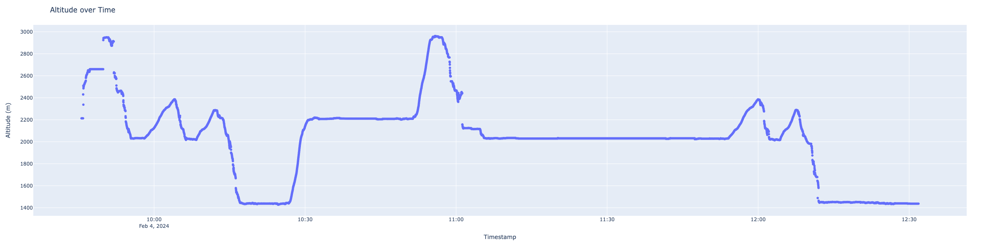

In [20]:
# Plot alt over time 
plot_total_alt_over_time(df_to_be_labeled)

# Get time stamps from hovering over plot 

In [21]:
# Add 'on_lift' column to df and set all values to 0
df_to_be_labeled['on_lift'] = 0

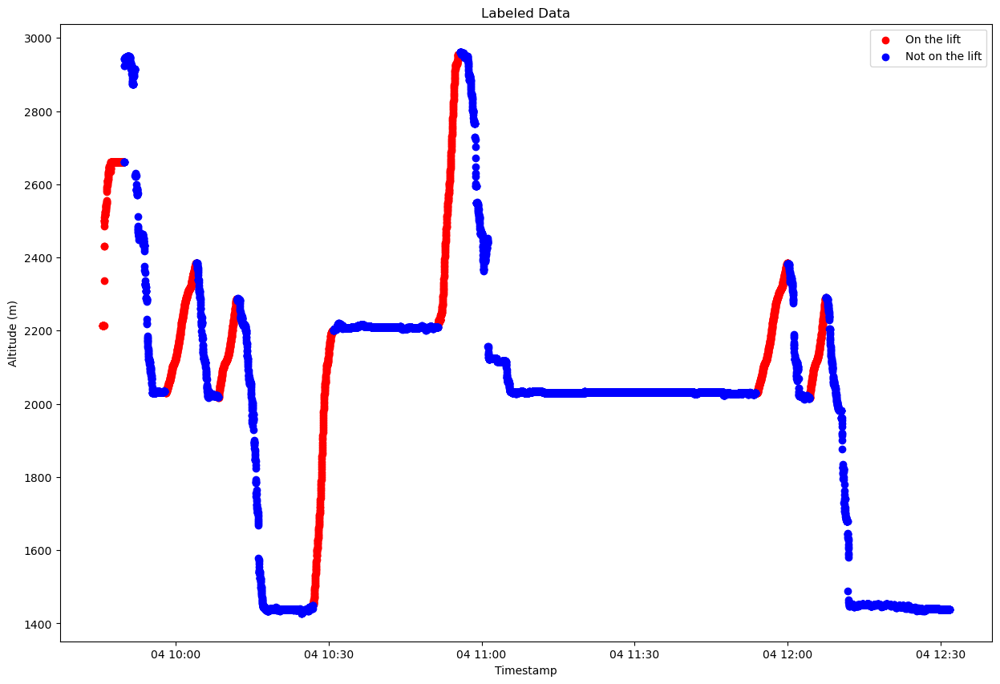

In [22]:
# Manually noted timestamps for lift rides
lift_rides = [
    ('2024-02-04 09:45:35', '2024-02-04 09:49:49'), # you may exclude this sesction due to unclear location data 
    ('2024-02-04 09:57:50', '2024-02-04 10:04:02'),
    ('2024-02-04 10:08:21', '2024-02-04 10:11:59'),
    ('2024-02-04 10:26:52', '2024-02-04 10:30:52'),
    ('2024-02-04 10:51:24', '2024-02-04 10:55:47'),
    ('2024-02-04 11:53:45', '2024-02-04 12:00:01'),
    ('2024-02-04 12:04:20', '2024-02-04 12:07:32'),
]

# Iterate and relabel df 
for start, end in lift_rides:
    # Update 'on_lift' column for rows where the timestamp falls within the lift ride's duration
    df_to_be_labeled.loc[(df_to_be_labeled['Timestamp'] >= start) & (df_to_be_labeled['Timestamp'] <= end), 'on_lift'] = 1

# Show plot with colored labels 
plot_manual_labeling(df_to_be_labeled)

# Show map with lift rides only 
lift_rides_map = map_lift_rides(df_to_be_labeled)
lift_rides_map

# Export

In [23]:
# export to CSV
name_of_csv_labeled='df_166_relabeled.csv'
df_to_be_labeled.to_csv(name_of_csv_labeled, index=False)